In [126]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.graphics.gofplots as smg
import plotly.graph_objects as go
import plotly.express as px
import os
from google.colab import drive
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly.colors as pc
import plotly.subplots as sp
import plotly.figure_factory as ff
%matplotlib inline
import warnings
'''to clear the warning message'''
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

warnings.filterwarnings("ignore", category=DeprecationWarning)

In [127]:
drive.mount('/content/drive')
cwd = os.getcwd()
print(cwd)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive


In [128]:
%cd '/content/drive/MyDrive'

/content/drive/MyDrive


In [129]:
!ls

 aggregated_data_final.csv
'Colab Notebooks'
 ColabNotebooks
'CV - Prakash Srinivasan(New_intern) (1).pdf'
 Dictionary.xlsx
 FATER_PRESENTATION.mp4
 Fater_Processing.csv
 future_data.csv
 grouped_data_02.csv
 grouped_data_final.csv
 historical_data.csv
 merged_data_final.csv
 one_hot_encoded_data.csv
'Personalizing Exoskeleton .gdoc'
'Personalizing Exoskeleton .pdf'
 processed_merged_data.csv
 promo.xlsx
'RECHANGED_FATER_FINAL (3) (1).gdoc'
'RECHANGED_FATER_FINAL (3).gdoc'
'RECHANGED_FATER_FINAL (3).pdf'
 rework_mergedata_anamoly.csv
 sellout.xlsx
 station_belem.csv
 submission_data.csv
 train_data.csv


In [130]:
merged_data = pd.read_csv('/content/drive/MyDrive/merged_data_final.csv')
aggregated_data = pd.read_csv('/content/drive/MyDrive/aggregated_data_final.csv')
grouped_data = pd.read_csv('/content/drive/MyDrive/grouped_data_final.csv')

## ***Sales with respect to Each Products***
***

>*By analyzing this time series for sales with respect to products, we can gain the following insights:*

>
*   *The dataset provides information about the performance of different products in terms of sales.*
* *We can compare the sales generated by different products, identifying the best-selling products and understanding their popularity in the market.*
* *Analyzing the time series of sales can help identify trends and patterns in the demand for specific products, enabling businesses to adjust their inventory and production accordingly.*
* *The number of units sold for each product indicates the market demand and can be used to forecast future sales and plan production quantities.*
* *Analyzing the sales of different products over time can help identify seasonal effects, product life cycles, and potential opportunities for product diversification or expansion.*

In [131]:
#print(aggregated_data)

In [132]:
fig = go.Figure()


for product in aggregated_data['Referenza (Products)'].unique():
    # Filtering the data for the current product
    product_data = aggregated_data[aggregated_data['Referenza (Products)'] == product]

    fig.add_trace(go.Scatter(
        x=product_data['Data_inizio'],
        y=product_data['Pezzi'],
        mode='markers',
        name=f'Pack Sales - {product}'
    ))

fig.update_layout(
    title='Time Series - Pack Sales',
    xaxis=dict(
        title='Date',
        tickformat='%Y-%b-%d (%a)',
        rangeslider=dict(
            visible=True,
            thickness=0.05,
            bgcolor='lightgray',
        ),
        type='date',
        range=[aggregated_data['Data_inizio'].min(), aggregated_data['Data_inizio'].max()]
    ),
    yaxis=dict(
        title='Pack Sales',
        tickformat=',.0f'
    ),
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.05,
        xanchor='right',
        x=-0.1
    ),
    height=500
)

fig.show()

### ***Product Categories & their Performance over time***
***

>*   *we have different category of products such as Bd (Baby Dry), Green Gen, Il Costumino, PMP Naturello, Progr.Mut, Progressi, SL, Sluna, Sole.*
>*   *Let's first Explore the Baby Dry category and here we have different subcategories depend on pack size and other constrains.*

>*`BD (Baby Dry)`*

>*  *Most of the `Baby Dry Products Sale is high untill March 2nd Week, and its gradually decreased and in goes below 500 packs till the end of June.`*
*  *From `July it started increasing gradually increasing on further weeks and going to the peak`.*
*  *This is o`bvious fact that the sales are correlated with Seasons. In the winter season, There was a heavy demand for the Baby dries, as the baby needs frequent change of Pampers`.*
*  *We can also see that `before the winter starts, there is a sudden hike in the purchase, it may be because customers are doing bulk purchase, as they don't prefer to frequently going to the shop for purchase in winter. Also they need more packs in winter.`*

>*`Green Gen`*

>*   *Green Generation is the `Pampers diaper with a green soul`, for all mothers looking for a product with a lower environmental impact.*
*   *Suitable for children from 4 to 16 KG, which means from 1 month baby to 5 years of 2.5 years of a baby. It also has washable and adjustable panties.*
*   *Though this Product attract the customers, we can see that the` sales of this product from 2nd week of July, it may be because this category of innovative green products have been launched from July.`*

>*`Il Costumino CP`*

>*   *These category of diaper will be `Great for the sea or the pool`, because it does not swell in water like a normal diaper.*
*   *It's obvious that `mom's perfer their babies to play with water in summer, not in winter`.*
*   *In the above plot, we can see the trend that, `the pack of products from this category sale is below 50 in winters`, and `from the 1st week of May the sale is increasing gradually in each week and touches the peak in June and July.`*
*   *Again from the Mid of August, it started decreasing slowly.*

>*`PMP Naturello`*

>*   *This type of Diaper containing cotton and natural materials derived from plants which customers purchase normally in the market*
*   *Though this product does not have high demand in the market, still the `purchase is stable for all the month of the year`.*

>*`Progressi`*

>*   *Progessi is the category which hold lot of sub categories. Though we can find any continuous trend for this categories, some of the Products like `Progressi XL Trio, Progressi Mini Trio Pack, Progressi Midi Trio Pack, Progressi Maxi Trio Pack, Progressi Junior Trio Pack, Progr.Mut. XL Trio Pack, Progr.Mut Maxi Trio Pack, Progr. Mut. Junior Trio Pack` does not have much demand in the market, in other means it does not have good purchase rate.*

>*`SL Mutandino`*

>*  *Same like Progressi, In Mutandino category Products, all the `Trio Packs have same trend, with very low and no purchase rate.`*
*   *Also, SL `(Sole & Luna) Pampers are diapers equipped with a special filtering and absorbent fabric with delicate Aloe lotion to prevent irritation on the baby's skin.`*
*   *Winter: In colder climates, the air tends to be drier, which can lead to dry skin in babies. The Aloe lotion in diapers can help moisturize and soothe their skin, providing protection against dryness and potential irritation caused by cold weather and indoor heating systems.*
*   *Summer: Hot and humid weather during summer can cause sweating and increased moisture in the diaper area. This can contribute to diaper rash and skin irritation. Aloe lotion in diapers can help soothe and protect the skin from irritation, as well as provide a barrier against wetness.*
*   *Here we can see the trend that demand of this category products are in both summer and winter.*













### ***Sales with respect to different Store***
***

>*The time series plot represents the sales data for various stores over a period of time. The plot provides insights into the sales performance of different stores and allows us to analyze trends and patterns in their sales data. By examining this time series plot, we can derive the following insights:*

>
* *Comparison of Store Performance: The plot allows us to compare the sales performance of different stores. We can visually analyze which stores consistently perform well or show fluctuations in their sales over time.*
* *Identifying Sales Trends: The plot helps us identify sales trends for individual stores. We can observe if sales are increasing, decreasing, or remaining stable over time for each store.*
* *Seasonal Patterns: The plot may reveal seasonal patterns in store sales. Certain stores may experience higher sales during specific seasons or months, indicating seasonal demand patterns or factors influencing customer behavior.*
* *Outliers or Anomalies: The plot enables us to spot any outliers or unusual sales patterns for specific stores. These anomalies can help identify factors that significantly impact sales performance, such as special promotions or external events.*
* *Store-to-Store Comparison: By comparing the sales trajectories of different stores, we can identify high-performing stores, stores with similar sales patterns, or stores that may require further investigation due to their unique sales behavior.*
* *Performance Evaluation: The plot assists in evaluating the effectiveness of sales strategies and initiatives implemented by different stores. It allows us to assess the impact of marketing campaigns, pricing changes, or operational decisions on sales performance.*




In [133]:
fig = go.Figure()

# Iterating each product
for product in merged_data['Referenza (Products)'].unique():
    # Filter the data for the current product
    product_data = merged_data[merged_data['Referenza (Products)'] == product]

    fig.add_trace(go.Scatter(
        x=product_data['Data_inizio'],
        y=product_data['Pezzi'],
        mode='markers',
        name=f'Pack Sales - {product}',
        hovertemplate="PuntoVendita: %{text}<br>Date: %{x}<br>Pack Sales: %{y}",
        text=product_data['PuntoVendita']
    ))


fig.update_layout(
    title='Time Series - Pack Sales',
    xaxis=dict(
        title='Date',
        tickformat='%Y-%b-%d (%a)',
        rangeslider=dict(
            visible=True,
            thickness=0.05,
            bgcolor='lightgray',
        ),
        type='date',
        range=[merged_data['Data_inizio'].min(), merged_data['Data_inizio'].max()]
    ),
    yaxis=dict(
        title='Pack Sales',
        tickformat=',.0f'
    ),
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.05,
        xanchor='right',
        x=-0.1
    ),
    height=500
)

fig.show()

In [134]:
# Convert 'Data_inizio' column to datetime
merged_data['Data_inizio'] = pd.to_datetime(merged_data['Data_inizio'])
merged_data['inizio_promo_final'] = pd.to_datetime(merged_data['inizio_promo_final'])
merged_data['fine_promo_final'] = pd.to_datetime(merged_data['fine_promo_final'])

In [135]:
aggregated_data['Data_inizio'] = pd.to_datetime(aggregated_data['Data_inizio'])

## ***Revenue, Promotion Duration & Promotion Count***
***

>*"Revenue, Promotion Duration & Promotion Count" represents the relationship between revenue, promotion duration, and the count of promotions. This analysis provides insights into how promotion duration and the number of promotions impact the revenue generated by a business.*

>* *Revenue: Revenue refers to the total amount of money generated by the business through sales during a specific period. It is an essential metric that indicates the financial performance of the business.*
* *Promotion Duration: Promotion duration refers to the length of time between the start and end of a promotion. It measures the duration for which a particular promotion is active and available to customers.*
* *Promotion Count: Promotion count represents the number of promotions conducted by the business during a given period. It indicates the frequency of promotional activities undertaken to attract customers and stimulate sales.*

>>   * *Revenue represents the total amount of money generated by the business through sales.*
>>* *Promotion Duration measures the length of time a promotion is active and available to customers.*
>>* *Promotion Count represents the number of promotions conducted by the business.*
>>* *Analyzing these variables helps determine the effectiveness of promotions and their impact on revenue.*
>>* *It helps identify the ideal promotion duration for maximizing revenue.*
>>* *Businesses can assess the influence of promotion count on overall revenue.*
>>* *Identifying revenue patterns helps in optimizing promotional strategies.*
>>* *It enables businesses to evaluate the performance of individual promotions.This analysis aids in making data-driven decisions and maximizing revenue growth.*

In [136]:
# Revenue and Packs Sold Line Chart
# Create a figure object
fig = go.Figure()

# Iterate over each product
for product in aggregated_data['Referenza (Products)'].unique():
    # Filter the data for the current product
    product_data = aggregated_data[aggregated_data['Referenza (Products)'] == product]

    # Add a line trace for revenue
    fig.add_trace(go.Scatter(
        x=product_data['Data_inizio'],
        y=product_data['Revenue'],
        mode='lines',
        name=f'Revenue - {product}'
    ))

    # Add a line trace for pack sales
    fig.add_trace(go.Scatter(
        x=product_data['Data_inizio'],
        y=product_data['Pezzi'],
        mode='lines',
        name=f'Pack Sales - {product}',
        yaxis='y2'  # Assign the trace to the secondary y-axis
    ))

# Set the title and axis labels
fig.update_layout(
    title='Time Series - Revenue and Pack Sales',
    xaxis=dict(
        title='Date',
        tickformat='%Y-%b-%d (%a)',  # Set the date format with month name and day of the week
        rangeslider=dict(  # Enable the range slider
            visible=True,
            thickness=0.05,
            bgcolor='lightgray',
            range=[aggregated_data['Data_inizio'].min(), aggregated_data['Data_inizio'].max()]  # Set the initial range of the range slider
        ),
        type='date'  # Set the x-axis type to date
    ),
    yaxis=dict(
        title='Revenue',
        tickformat='$,.2f'
    ),
    yaxis2=dict(
        title='Pack Sales',
        tickformat=',.0f',
        overlaying='y',
        side='right'
    ),
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.05,
        xanchor='right',
        x=-0.1  # Move the legend slightly to the right
    ),
    height=500
)

# Display the interactive plot
fig.show()

# Promotion Metrics Bar Chart
fig = go.Figure()

for product in grouped_data['Product'].unique():
    product_data = grouped_data[grouped_data['Product'] == product]
    fig.add_trace(go.Bar(x=product_data['WeekStart'], y=product_data['PromotionCount'],
                         name=f'{product} Promotion Count'))

fig.update_layout(title='Promotion Count by Product',
                  xaxis=dict(title='Week Start Date'),
                  yaxis=dict(title='Promotion Count'))

fig.show()

# Average Promotion Duration Line Chart
fig = go.Figure()

for product in grouped_data['Product'].unique():
    product_data = grouped_data[grouped_data['Product'] == product]
    fig.add_trace(go.Scatter(x=product_data['WeekStart'], y=product_data['TotalPromotionDuration'],
                             mode='lines', name=f'{product} Promotion Duration'))

fig.update_layout(title='Average Promotion Duration by Product',
                  xaxis=dict(title='Week Start Date'),
                  yaxis=dict(title='Promotion Duration (days)'))

fig.show()

In [137]:
# Group the merged data by 'Referenza (Products)' and 'Data_inizio' to calculate total packs sold per week
weekly_sales = merged_data.groupby(['Referenza (Products)', 'Data_inizio'])['Pezzi'].sum().reset_index()

# Create a new DataFrame with relevant columns
group_data = pd.DataFrame()
group_data['Product'] = weekly_sales['Referenza (Products)']
group_data['WeekStart'] = weekly_sales['Data_inizio']
group_data['TotalPacksSold'] = weekly_sales['Pezzi']
group_data['PromotionCount'] = merged_data.groupby(['Referenza (Products)', 'Data_inizio'])['titolo (Promotions)'].count().reset_index()['titolo (Promotions)']

# Sort the DataFrame by 'WeekStart' in ascending order
group_data = group_data.sort_values('WeekStart')

# Print the DataFrame to observe the frequently sold products
print(group_data)

                            Product  WeekStart  TotalPacksSold  PromotionCount
0                 BD Esapack Junior 2021-12-27              14              14
113            BD Extralarge Quadri 2021-12-27              65              25
1664            Progressi Junior VP 2021-12-27              36              10
331                      BD Midi VP 2021-12-27              18              15
1648      Progressi Junior Triopack 2021-12-27               9               3
...                             ...        ...             ...             ...
2905          Sole e Luna Maxi Trio 2022-09-05               3               3
2091              Progressi Mini VP 2022-09-05              50              18
2128  Progressi Mutandino Junior VP 2022-09-05              38              22
471          BD Mutandino Giga Maxi 2022-09-05              14              14
1853              Progressi Maxi VP 2022-09-05              84              30

[3006 rows x 4 columns]


In [138]:
# Create a line plot
fig = go.Figure()

# Add lines for each product's TotalPacksSold
for product, data in group_data.groupby('Product'):
    fig.add_trace(go.Scatter(
        x=data['WeekStart'],
        y=data['TotalPacksSold'],
        name=product,
        mode='lines',
        line=dict(width=2),
        hovertemplate='%{x}<br>Total Packs Sold: %{y}<br>Promotion Titles:<br>%{customdata}',
        customdata=merged_data.loc[merged_data['Referenza (Products)'] == product, 'titolo (Promotions)'],
        legendgroup=product
    ))

# Add lines for each product's PromotionCount on the right y-axis
for product, data in group_data.groupby('Product'):
    fig.add_trace(go.Scatter(
        x=data['WeekStart'],
        y=data['PromotionCount'],
        name=product + ' (PromotionCount)',
        mode='lines',
        line=dict(width=2, dash='dash'),
        hovertemplate='%{x}<br>Promotion Count: %{y}<br>Promotion Titles:<br>%{customdata}',
        customdata=merged_data.loc[merged_data['Referenza (Products)'] == product, 'titolo (Promotions)'],
        legendgroup=product,
        yaxis='y2'
    ))

# Set the layout
fig.update_layout(
    title='Total Packs Sold and Promotion Count by Product',
    xaxis=dict(title='Week Start'),
    yaxis=dict(title='Total Packs Sold'),
    yaxis2=dict(
        title='Promotion Count',
        overlaying='y',
        side='right',
        showgrid=False
    ),
    legend=dict(
        orientation='v',
        x=1.06,
        y=0.5,
        xanchor='left',
        yanchor='middle'
    ),
    hovermode='x unified',
    margin=dict(r=150)
)

# Display the interactive plot
fig.show()

In [139]:
# Calculate the maximum and minimum of PromotionCount
max_promotion_count = group_data['PromotionCount'].max()
min_promotion_count = group_data['PromotionCount'].min()

# Calculate the maximum and minimum of TotalPacksSold
max_quantity_sold = group_data['TotalPacksSold'].max()
min_quantity_sold = group_data['TotalPacksSold'].min()

#print("Maximum Promotion Count:", max_promotion_count)
#print("Minimum Promotion Count:", min_promotion_count)
#print("Maximum Quantity Sold:", max_quantity_sold)
#print("Minimum Quantity Sold:", min_quantity_sold)

In [140]:
grouped_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 857 entries, 0 to 856
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Product                 857 non-null    object 
 1   WeekStart               857 non-null    object 
 2   TotalRevenue            857 non-null    float64
 3   TotalPacksSold          857 non-null    int64  
 4   PromotionCount          857 non-null    int64  
 5   TotalPromotionDuration  857 non-null    int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 40.3+ KB


In [141]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121411 entries, 0 to 121410
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   PuntoVendita          121411 non-null  object        
 1   NodoPromo             121411 non-null  object        
 2   Referenza (Products)  121411 non-null  object        
 3   Data_inizio           121411 non-null  datetime64[ns]
 4   Revenue               121411 non-null  float64       
 5   Pezzi                 121411 non-null  int64         
 6   DayOfMonth            121411 non-null  int64         
 7   inizio_promo_final    121411 non-null  datetime64[ns]
 8   fine_promo_final      121411 non-null  datetime64[ns]
 9   titolo (Promotions)   121411 non-null  object        
 10  month_promo_inizio    121411 non-null  int64         
 11  promo_month           121411 non-null  int64         
 12  promo_week            121411 non-null  int64         
 13 

In [142]:
max_duration = merged_data['promo_duration_days'].max()
#print("Maximum Promotion Duration:", max_duration, "days")

In [143]:
max_duration_row = merged_data.loc[merged_data['promo_duration_days'].idxmax()]
#print("Row with Maximum Promotion Duration:")
#print(max_duration_row)

## Stock Keeping Unit (SKU)
***


>*A Stock Keeping Unit (SKU) is a unique identifier assigned to a specific product or item in inventory management. It helps businesses track and manage their inventory by providing a distinct code or number for each individual product variant, such as size, color, or model.*

>*In this context, we are using SKU as a threshold to determine the availability of products. When the final saleable unit of an SKU is removed from the shelf, it is considered as "Out of Stock" (OOS). The OOS event continues until the presence of a saleable unit on the shelf is replenished.*

>*By analyzing the correlation between SKU and sales, we can draw insights and make informed decisions. Here are some key points:*

>
*   ***Assumption of SKU:*** *We assume a specific threshold value for SKU, which represents the minimum inventory level for a product to be considered in stock.*
* ***Out of Stock (OOS):*** *If the sales for a specific SKU fall below the SKU threshold, it is labeled as "Out of Stock." This indicates that the product is not available for purchase due to insufficient inventory.*
* ***In Stock:*** *Conversely, if the sales for a SKU exceed the SKU threshold, it is labeled as "In Stock." This implies that the product is available for purchase as there is sufficient inventory.*
* ***Effective Inventory Management:*** *By monitoring the OOS and In Stock events, businesses can assess the impact of stock availability on sales performance. They can identify products that frequently go out of stock and implement strategies to minimize out-of-stock situations.*
* ***Optimizing Inventory Levels:*** *Analyzing SKU and sales data helps businesses determine the appropriate inventory levels for different products. It enables them to allocate resources effectively, prevent stockouts, and avoid excess inventory.*
* ***Mitigating Sales Losses:*** *Focusing on a smaller number of SKUs can be a strategic approach to reduce sales losses resulting from out-of-stock situations. By prioritizing the management of key SKUs, businesses can ensure better availability and capitalize on sales opportunities.*


In [144]:
# Filter the data where product sold is below 5
condition1 = (merged_data['Pezzi'] < 5) & (merged_data['Data_inizio'] == merged_data['fine_promo_final'])
condition2 = (merged_data['Pezzi'] < 5) & (merged_data['Data_inizio'] > merged_data['fine_promo_final']) & (merged_data['Data_inizio'] < merged_data['inizio_promo_final'])
condition3 = (merged_data['Pezzi'] < 5) & (merged_data['inizio_promo_final'] == merged_data['fine_promo_final'])
condition4 = (merged_data['Pezzi'] < 5) & (merged_data['titolo (Promotions)'].value_counts() > 10)
condition5 = (merged_data['Pezzi'] < 5) & (merged_data['promo_duration_days'] > 1) & (merged_data.groupby('titolo (Promotions)')['Pezzi'].diff() < 0)

filtered_data = merged_data[condition1 | condition2 | condition3 | condition4 | condition5]

# Create a new column for the legend combining promotion title and product title
filtered_data['Legend'] = filtered_data['titolo (Promotions)'] + ' - ' + filtered_data['Referenza (Products)']

# Create a scatter plot
fig = px.scatter(filtered_data, x='Data_inizio', y='Pezzi', color='Legend',
                 hover_data=['Referenza (Products)', 'titolo (Promotions)', 'PuntoVendita', 'promo_duration_days'])

# Customize the layout
fig.update_layout(
    title='Products Sold Below 5',
    xaxis_title='Start Date',
    yaxis_title='Product Quantity',
)

# Show the plot
fig.show()

<ipython-input-144-617239b4bfb3>:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



### ***Conditions used to label "In Stock" & "No Stock"***
***

>*After analysing all the posibile patterna and trend, we are labelling our Target column, "Stock" using the below assumptions:*

>*`Condition 1:` It identifies cases where the `product is sold below 5 units during a single-day promotion`. This condition highlights `instances where the product's sales are particularly low during a short promotional period. It suggests that the product may not have garnered much customer interest or that the promotion itself may not have been effective in driving sales.`*

>*`Condition 2:` It captures situations where the product is sold below 5 units during the gap between promotions. This condition signifies `periods when there is no active promotion, yet the product's sales remain low. It indicates that the product may struggle to generate significant sales without promotional activities. This could be attributed to various factors, such as lack of customer demand, pricing, competition, or other market dynamics.` Understanding the reasons behind the low sales during these non-promotional periods can provide insights into the product's overall market performance and help in devising strategies to improve sales during such periods.*

>*`Condition 3:` It refers to the scenario where the `product is sold below 5 units on the final day of a promotion, and there is no gap before the next promotion starts. This condition captures instances where the product's sales drop below the threshold on the last day of a promotion and immediately transitions into the next promotion without any intervening non-promotion period.`*

>*`Condition 4:` It refers to the situation where the `product is sold below 5 units and has been promoted more than 10 times. This condition identifies cases where the product's sales are consistently low, but it has been actively promoted multiple times.` It highlights products that may require further attention or adjustments in their promotional strategies due to their consistently low sales despite frequent promotions.*

>*`Condition 5:` It identifies cases where the `product is sold below 5 units, the promotion duration is more than 1 day, and there is a decreasing trend in sales during the promotion. This condition suggests that despite running promotions for an extended period, the product's sales decline over time.` It highlights products that may need a closer examination of their promotional strategies, as the extended duration of promotions does not lead to sustained or increasing sales. Adjustments to the promotion structure or marketing efforts may be necessary to address the declining sales trend and improve the effectiveness of promotions for these products.*

In [145]:
# Define the conditions
condition1 = (merged_data['Pezzi'] < 5) & (merged_data['Data_inizio'] == merged_data['fine_promo_final'])
condition2 = (merged_data['Pezzi'] < 5) & (merged_data['Data_inizio'] > merged_data['fine_promo_final']) & (merged_data['Data_inizio'] < merged_data['inizio_promo_final'])
condition3 = (merged_data['Pezzi'] < 5) & (merged_data['inizio_promo_final'] == merged_data['fine_promo_final'])
condition4 = (merged_data['Pezzi'] < 5) & (merged_data['titolo (Promotions)'].map(merged_data['titolo (Promotions)'].value_counts()) > 10)
condition5 = (merged_data['promo_duration_days'] > 1) & (merged_data.groupby('titolo (Promotions)')['Pezzi'].diff() < 0)

# Create the new column 'Stock'
merged_data['Stock'] = np.where(condition1 | condition2 | condition3 | condition4 | condition5, 'Out of Stock', 'In Stock')

In [146]:
#print(merged_data)

### ***In-Stock & Out Of Stock***
***

>* *After analyzing the data, we found that 57.3% of products are classified as "Out of Stock" and 42.7% as "In Stock".
This indicates a significant proportion of products experience stock shortages or unavailability.*
* *The high percentage of "Out of Stock" products suggests potential challenges in inventory management and supply chain operations.*
* *Stock shortages can result in missed sales opportunities and potential customer dissatisfaction.*
* *To address this issue, optimizing inventory management and implementing effective replenishment strategies is crucial.*
* *By reducing the occurrence of stockouts, the company can enhance customer satisfaction and increase sales revenue.
Close monitoring of stock levels and timely restocking processes are essential to meet customer demand.*
* *Leveraging data-driven approaches for demand forecasting can help maintain a healthy balance between stock availability and customer demand.*
* *Improving overall operational efficiency and maximizing sales potential are key benefits of managing stock availability effectively.*
* *The stock status distribution provides valuable insights for implementing strategies to minimize stockouts and enhance customer satisfaction.*

In [147]:
# Define the colors for each stock status
colors = ['#21C1D1', '#D387F7']

# Calculate the count of each stock status
stock_counts = merged_data['Stock'].value_counts()

# Create a pie chart using plotly
fig = go.Figure(data=go.Pie(labels=stock_counts.index, values=stock_counts.values))

# Customize the colors of the pie chart
fig.update_traces(marker=dict(colors=colors))

# Customize the layout
fig.update_layout(title='Stock Status')

# Display the plot
fig.show()

# ***CONCLUSION***
***
>*In conclusion, this project focused on analyzing sales and revenue data in relation to various factors such as promotion duration, store location, product category, and stock availability. Several key findings and insights were derived from the analysis:*

>
*   ***Promotion Duration:*** *The analysis revealed that longer promotion durations tend to generate higher sales and revenue. This suggests that extended promotional periods provide more time for customers to engage with the promotions and make purchases.*

* ***Store Performance:*** *Different store locations exhibited varying levels of sales and revenue. Understanding the performance of each store can help in identifying areas for improvement and implementing targeted strategies to maximize sales potential.*

* ***Product Category:*** *Certain product categories showed higher sales and revenue compared to others. This information can guide decision-making regarding product assortment, marketing strategies, and inventory management to capitalize on popular product categories.*

* ***Stock Availability:*** *The analysis highlighted the importance of managing stock availability effectively. The occurrence of stockouts can lead to missed sales opportunities and customer dissatisfaction. Strategies for optimizing inventory management, demand forecasting, and timely restocking are crucial for minimizing stockouts and improving customer satisfaction.*



### ***Preventing Out-of-Stock Situations:***
***

>*Based on the analysis conducted, the following strategies can be implemented to minimize the occurrence of out-of-stock (OOS) situations:*

>***Inventory Management:*** *Employing effective inventory management practices is crucial. This includes accurately forecasting demand, monitoring stock levels, and implementing automated replenishment systems. By ensuring optimal inventory levels, the risk of running out of stock can be minimized.*

>***Demand Planning:*** *Utilize historical sales data, market trends, and customer insights to forecast demand accurately. This enables businesses to anticipate fluctuations in demand and adjust their inventory levels accordingly.*

>***Supplier Collaboration:*** *Establish strong relationships and open lines of communication with suppliers. This can help in securing timely deliveries, negotiating favorable terms, and receiving updates on stock availability. Collaborating closely with suppliers can mitigate the risk of stockouts.*

>***Continuous Monitoring:*** *Implement real-time inventory tracking systems to monitor stock levels across all sales channels. This enables timely identification of low stock situations, allowing for proactive measures to prevent stockouts.*

>***Reorder Point Optimization:*** *Set appropriate reorder points for each SKU based on lead times, demand variability, and desired service levels. This ensures that new orders are placed in a timely manner to maintain adequate stock levels.*

>***Sales and Inventory Alignment:*** *Regularly analyze sales data to identify product performance patterns. Adjust inventory levels and product allocations based on sales trends, seasonality, and promotional activities.*

>***Data-Driven Decision Making:*** *Leverage data analytics tools to gain insights into sales patterns, customer behavior, and market trends. These insights can guide proactive decision-making regarding stock replenishment, product assortment, and promotional strategies.*

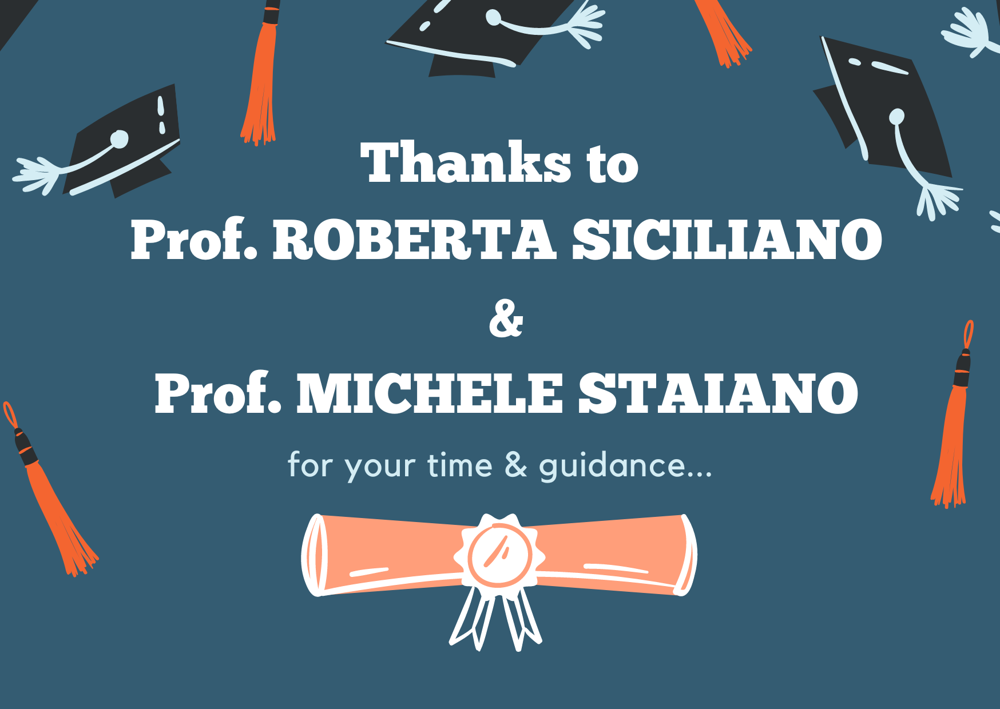